In [6]:
import os
if not os.path.exists("TAM"):
    !git clone https://github.com/xmed-lab/TAM.git
!pip install -q transformers==4.37.2 accelerate bitsandbytes matplotlib opencv-python scipy PyMuPDF tools

In [7]:
import sys, torch, cv2, gc
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
from transformers import AutoTokenizer, AutoImageProcessor, LlavaProcessor, LlavaForConditionalGeneration

sys.path.append(os.path.abspath('TAM'))
from tam import TAM

device = "cuda" if torch.cuda.is_available() else "cpu"

# процессор собираем руками — на хабе битый конфиг
model_id = "llava-hf/llava-1.5-7b-hf"
tokenizer = AutoTokenizer.from_pretrained(model_id, use_fast=False)
image_processor = AutoImageProcessor.from_pretrained(model_id)
processor = LlavaProcessor(image_processor=image_processor, tokenizer=tokenizer)

model = LlavaForConditionalGeneration.from_pretrained(
    model_id, torch_dtype=torch.float16, low_cpu_mem_usage=True, device_map="auto"
)
model.eval()
print("ok")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

ok


## Данные
10 картинок из COCO val2017 — разные сцены, от одного объекта до сложных.



In [8]:
urls = [
    "http://images.cocodataset.org/val2017/000000039769.jpg",  
    "http://images.cocodataset.org/val2017/000000252219.jpg", 
    "http://images.cocodataset.org/val2017/000000181816.jpg",  
    "http://images.cocodataset.org/val2017/000000532481.jpg",
    "http://images.cocodataset.org/val2017/000000279278.jpg",  
    "http://images.cocodataset.org/val2017/000000480985.jpg",  
    "http://images.cocodataset.org/val2017/000000000139.jpg",  
    "http://images.cocodataset.org/val2017/000000000632.jpg",  
    "http://images.cocodataset.org/val2017/000000000785.jpg",  
    "http://images.cocodataset.org/val2017/000000000885.jpg",  
]

imgs = []
for u in urls:
    try:
        resp = requests.get(u, timeout=10)
        imgs.append(Image.open(BytesIO(resp.content)).convert("RGB"))
    except:
        pass
print(f"загружено {len(imgs)}")

загружено 10


## TAM на всех картинках
Для каждого изображения генерируем описание, прогоняем TAM, визуализируем карты для 3 ключевых слов.



In [ ]:
IMAGE_TOKEN_ID = 32000
STOP = {"i","see","a","an","the","and","is","on","in","with","of","are","some",
        "there","it","this","that","to","next","behind","front","image","picture",
        "features","several","two","three","one","can","also","has","have","its","by","as","from"}

prompt = "USER: <image>\nDescribe the main objects in this image concisely. ASSISTANT:"

for img_idx, img in enumerate(imgs):
    print(f"\n[{img_idx+1}/{len(imgs)}]")
    
    inputs = processor(text=prompt, images=img, return_tensors="pt").to(device, torch.float16)
    input_ids = inputs["input_ids"]
    attn = inputs["attention_mask"]

    tokens = []
    for t in input_ids[0].tolist():
        tokens.extend([IMAGE_TOKEN_ID]*576 if t == IMAGE_TOKEN_ID else [t])

    logit_list, gen_ids = [], []
    past = None
    cur_ids, cur_attn = input_ids, attn

    with torch.inference_mode():
        out = model(input_ids=cur_ids, pixel_values=inputs.get("pixel_values"),
                    attention_mask=cur_attn, use_cache=True, return_dict=True)
        logit_list.append(out.logits.cpu().float())
        past = out.past_key_values
        nxt = out.logits[0,-1].argmax(-1).item()
        gen_ids.append(nxt); tokens.append(nxt)

        for _ in range(30):
            if nxt == tokenizer.eos_token_id: break
            cur_ids = torch.tensor([[nxt]], device=device)
            cur_attn = torch.cat([cur_attn, torch.ones((1,1), device=device)], dim=1)
            out = model(input_ids=cur_ids, attention_mask=cur_attn,
                        past_key_values=past, use_cache=True, return_dict=True)
            logit_list.append(out.logits.cpu().float())
            past = out.past_key_values
            nxt = out.logits[0,-1].argmax(-1).item()
            gen_ids.append(nxt); tokens.append(nxt)

    text = tokenizer.decode(gen_ids, skip_special_tokens=True)
    print(f"ответ: {text}")

    last_img = len(tokens) - 1 - tokens[::-1].index(IMAGE_TOKEN_ID)
    special_ids = {
        'img_id': [IMAGE_TOKEN_ID],
        'prompt_id': [[IMAGE_TOKEN_ID], [tokens[last_img+1]]],
        'answer_id': [input_ids[0][-3:].tolist(), [tokenizer.eos_token_id]],
    }

    # 3 content-слова для визуализации
    targets, seen = [], set()
    for ri, tid in enumerate(gen_ids):
        w = tokenizer.decode([tid]).strip().lower()
        c = "".join(ch for ch in w if ch.isalpha())
        if len(c) > 2 and c not in STOP and c not in seen:
            targets.append((c, ri)); seen.add(c)
            if len(targets) == 3: break

    if not targets:
        del out, logit_list, past; gc.collect(); torch.cuda.empty_cache()
        continue

    img_scores = []
    tam_maps = {}
    max_ri = max(ri for _, ri in targets)
    for ri in range(max_ri + 1):
        try:
            hm = TAM(tokens=tokens, vision_shape=(24,24), logit_list=logit_list,
                     special_ids=special_ids, vision_input=np.array(img),
                     processor=processor, save_fn="", target_token=ri,
                     img_scores_list=img_scores, eval_only=True)
            for w, ti in targets:
                if ri == ti: tam_maps[w] = hm
        except:
            pass

    # рисуем
    fig, axes = plt.subplots(1, len(tam_maps)+1, figsize=(5*(len(tam_maps)+1), 5))
    if len(tam_maps) == 0:
        plt.close(); del out, logit_list, past; gc.collect(); torch.cuda.empty_cache()
        continue
    axes[0].imshow(img); axes[0].set_title("Original"); axes[0].axis("off")
    for i, (w, hm) in enumerate(tam_maps.items()):
        hm_r = cv2.resize(hm.astype(np.float32), img.size, interpolation=cv2.INTER_CUBIC)
        if hm_r.max() > 0: hm_r /= hm_r.max()
        axes[i+1].imshow(img)
        axes[i+1].imshow(hm_r, cmap='jet', alpha=0.5)
        axes[i+1].set_title(f"TAM: '{w}'", fontweight='bold')
        axes[i+1].axis("off")
    plt.suptitle(f"\"{text[:70]}\"", fontsize=10)
    plt.tight_layout(); plt.show()

    del out, logit_list, past; gc.collect(); torch.cuda.empty_cache()

## Raw CAM vs TAM
Сравниваем базовый метод (скалярное произведение без обработки) с полным TAM (ECI + RGF). Берём первые 5 картинок.

[1/5]
  The image features two cats lying on a pink couch. One cat is positioned on the left side of the couch, while the other


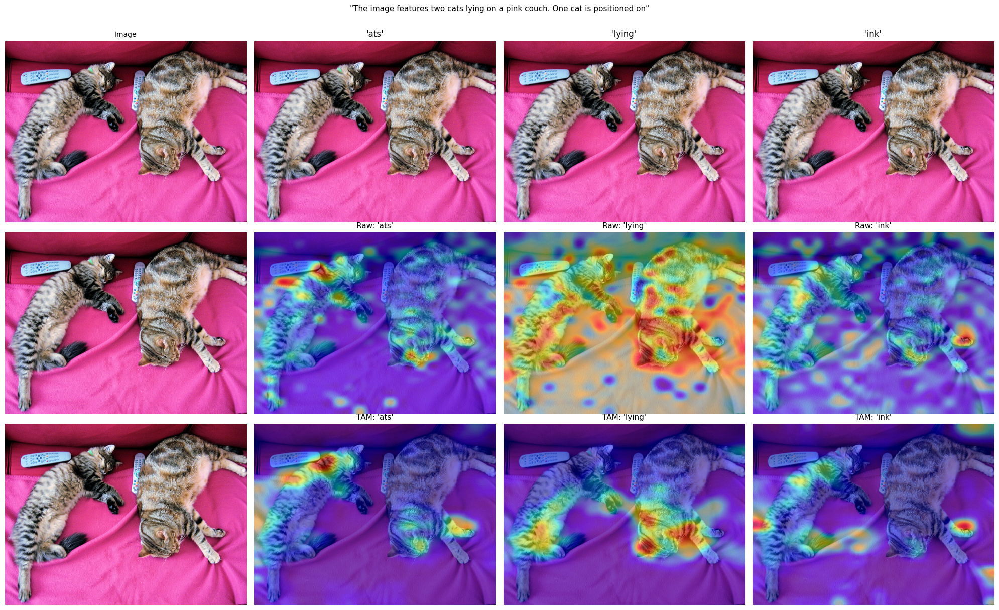

[2/5]
  The image features a man standing next to a shopping cart filled with various items, including clothes and a handbag. He is using his cell phone while


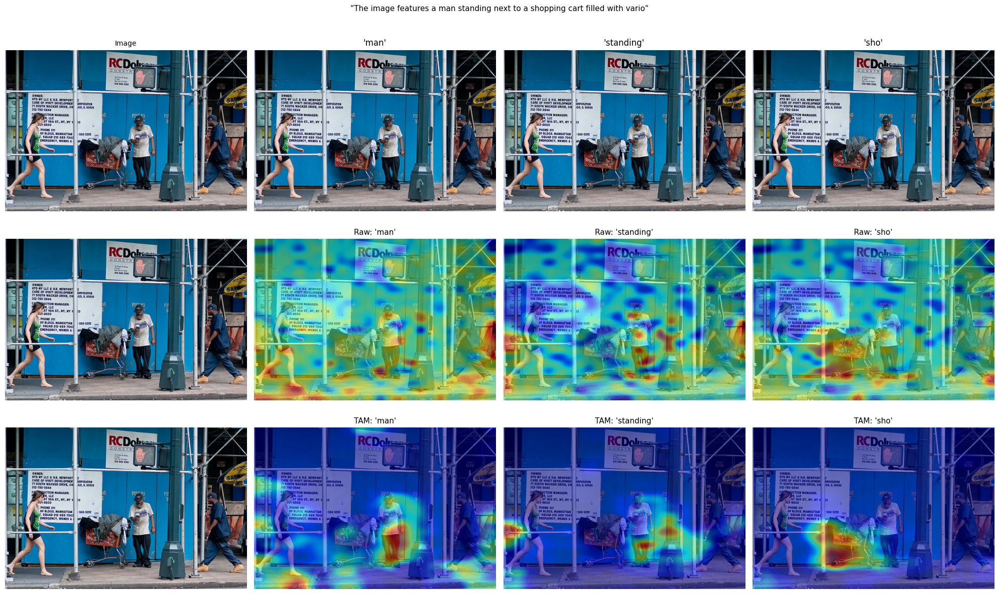

[3/5]
  The image features a statue of a man sitting on a wooden bench. The statue is positioned on the bench, giving the impression of a person


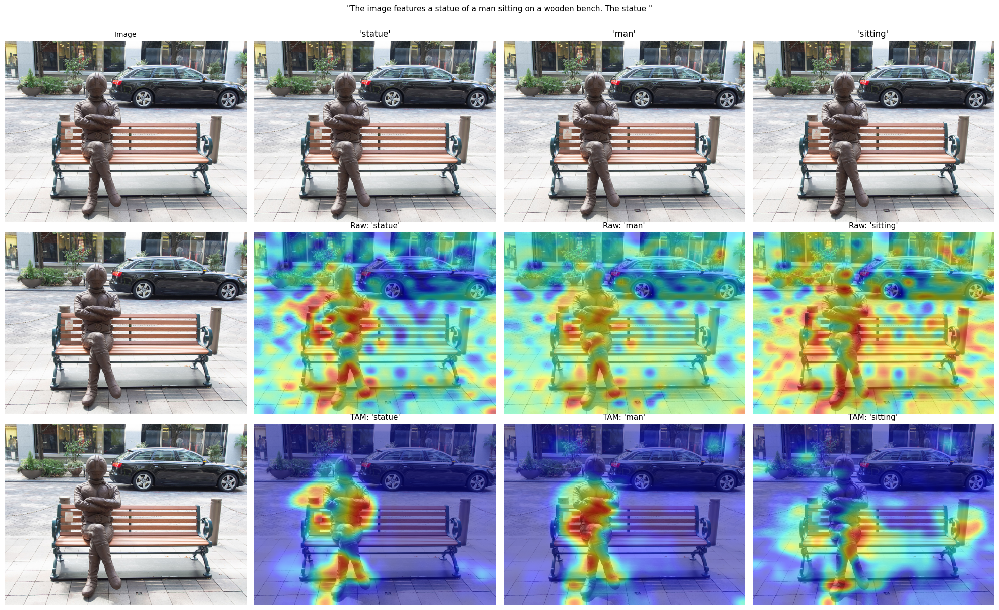

[4/5]
  The image features a person parasailing over the ocean, holding onto a rope attached to a parachute. The parasailer is


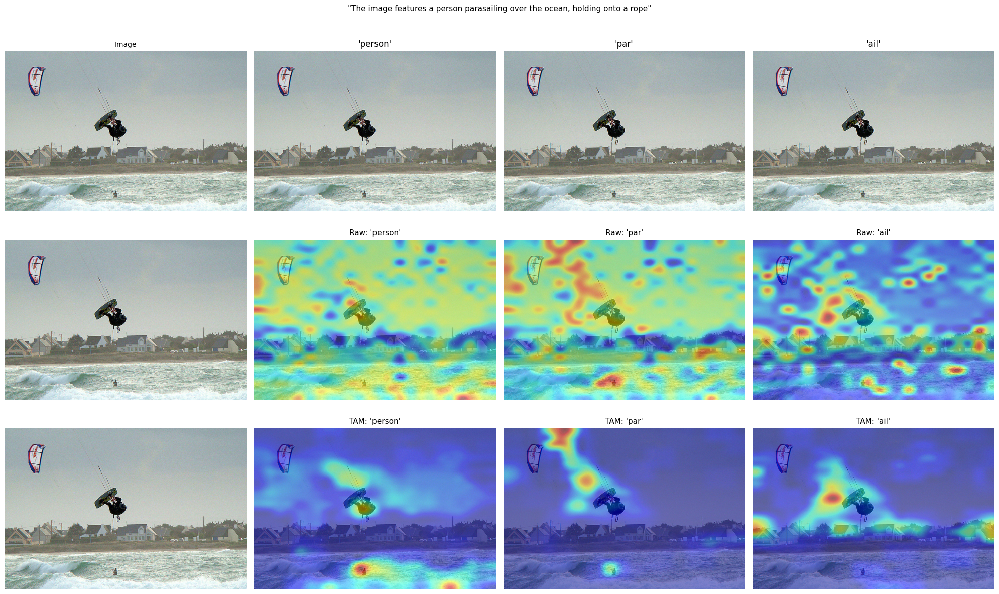

[5/5]
  The image features a group of people standing on a street, with a skateboard in the center of their attention. The skateboard is red and


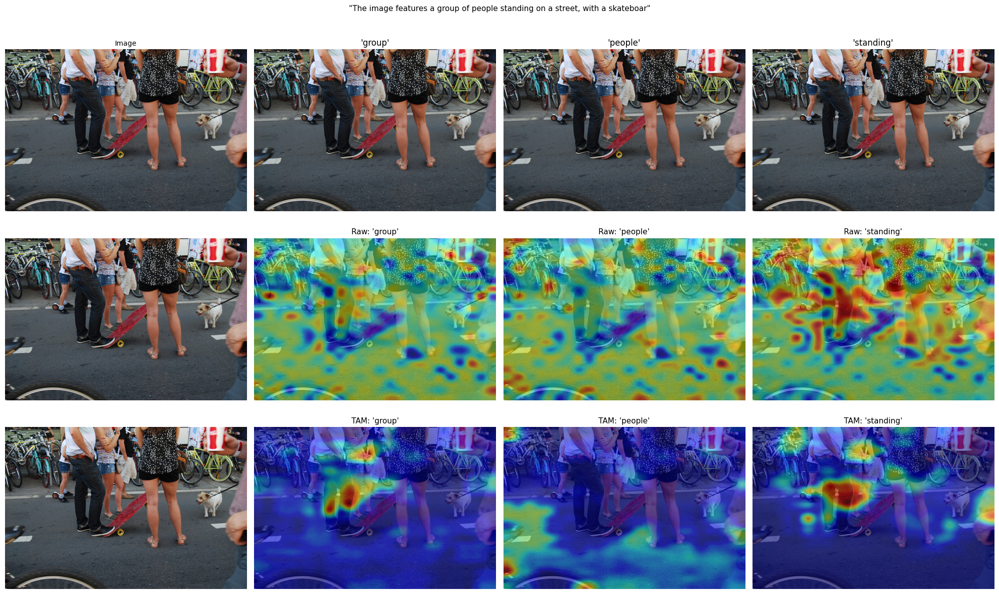

In [10]:
for img_idx, img in enumerate(imgs[:5]):
    print(f"[{img_idx+1}/5]")
    
    inputs = processor(text=prompt, images=img, return_tensors="pt").to(device, torch.float16)
    input_ids = inputs["input_ids"]
    attn = inputs["attention_mask"]

    tokens = []
    for t in input_ids[0].tolist():
        tokens.extend([IMAGE_TOKEN_ID]*576 if t == IMAGE_TOKEN_ID else [t])

    logit_list, gen_ids = [], []
    past = None
    cur_ids, cur_attn = input_ids, attn

    with torch.inference_mode():
        out = model(input_ids=cur_ids, pixel_values=inputs.get("pixel_values"),
                    attention_mask=cur_attn, use_cache=True, return_dict=True,
                    output_hidden_states=True)
        logit_list.append(out.logits.cpu().float())

        # визуальные фичи для raw cam
        all_hidden = out.hidden_states[-1][0].float()
        img_pos = (input_ids[0] == IMAGE_TOKEN_ID).nonzero(as_tuple=True)[0]
        vis_start = img_pos[0].item() if len(img_pos) > 0 else 0
        F_v = all_hidden[vis_start:vis_start+576]
        F_v_norm = model.language_model.model.norm(F_v.half()).float()
        lm_w = model.language_model.lm_head.weight.detach().float()

        past = out.past_key_values
        nxt = out.logits[0,-1].argmax(-1).item()
        gen_ids.append(nxt); tokens.append(nxt)

        for _ in range(30):
            if nxt == tokenizer.eos_token_id: break
            cur_ids = torch.tensor([[nxt]], device=device)
            cur_attn = torch.cat([cur_attn, torch.ones((1,1), device=device)], dim=1)
            out = model(input_ids=cur_ids, attention_mask=cur_attn,
                        past_key_values=past, use_cache=True, return_dict=True)
            logit_list.append(out.logits.cpu().float())
            past = out.past_key_values
            nxt = out.logits[0,-1].argmax(-1).item()
            gen_ids.append(nxt); tokens.append(nxt)

    text = tokenizer.decode(gen_ids, skip_special_tokens=True)
    print(f"  {text}")

    last_img = len(tokens) - 1 - tokens[::-1].index(IMAGE_TOKEN_ID)
    special_ids = {
        'img_id': [IMAGE_TOKEN_ID],
        'prompt_id': [[IMAGE_TOKEN_ID], [tokens[last_img+1]]],
        'answer_id': [input_ids[0][-3:].tolist(), [tokenizer.eos_token_id]],
    }

    targets, seen = [], set()
    for ri, tid in enumerate(gen_ids):
        w = tokenizer.decode([tid]).strip().lower()
        c = "".join(ch for ch in w if ch.isalpha())
        if len(c) > 2 and c not in STOP and c not in seen:
            targets.append((c, ri, tid)); seen.add(c)
            if len(targets) == 3: break

    if not targets:
        del out, logit_list, past, F_v, F_v_norm; gc.collect(); torch.cuda.empty_cache()
        continue

    # raw cam
    raw_maps = {}
    for word, ri, tid in targets:
        w_t = lm_w[tid].to(device)
        act = torch.matmul(F_v_norm.to(device), w_t).clamp(min=0).cpu().numpy()
        raw_maps[word] = act.reshape(24, 24)

    # tam
    img_scores, tam_maps = [], {}
    max_ri = max(ri for _, ri, _ in targets)
    for ri in range(max_ri + 1):
        try:
            hm = TAM(tokens=tokens, vision_shape=(24,24), logit_list=logit_list,
                     special_ids=special_ids, vision_input=np.array(img),
                     processor=processor, save_fn="", target_token=ri,
                     img_scores_list=img_scores, eval_only=True)
            for w, ti, _ in targets:
                if ri == ti: tam_maps[w] = hm
        except:
            pass

    words = [w for w in raw_maps if w in tam_maps]
    if not words:
        del out, logit_list, past, F_v, F_v_norm; gc.collect(); torch.cuda.empty_cache()
        continue

    # три ряда: оригинал, raw cam, tam
    fig, axes = plt.subplots(3, len(words)+1, figsize=(5*(len(words)+1), 12))
    labels = ["Original", "Raw CAM", "TAM (ECI+RGF)"]
    for r in range(3):
        axes[r, 0].imshow(img)
        axes[r, 0].set_ylabel(labels[r], fontsize=13, fontweight='bold', rotation=90, labelpad=15)
        if r == 0: axes[r, 0].set_title("Image", fontsize=10)
        axes[r, 0].axis("off")

    for ci, w in enumerate(words):
        axes[0, ci+1].imshow(img)
        axes[0, ci+1].set_title(f"'{w}'", fontsize=12)
        axes[0, ci+1].axis("off")

        raw_r = cv2.resize(raw_maps[w].astype(np.float32), img.size, interpolation=cv2.INTER_CUBIC)
        if raw_r.max() > 0: raw_r /= raw_r.max()
        axes[1, ci+1].imshow(img)
        axes[1, ci+1].imshow(raw_r, cmap='jet', alpha=0.5)
        axes[1, ci+1].set_title(f"Raw: '{w}'", fontsize=11)
        axes[1, ci+1].axis("off")

        tam_r = cv2.resize(tam_maps[w].astype(np.float32), img.size, interpolation=cv2.INTER_CUBIC)
        if tam_r.max() > 0: tam_r /= tam_r.max()
        axes[2, ci+1].imshow(img)
        axes[2, ci+1].imshow(tam_r, cmap='jet', alpha=0.5)
        axes[2, ci+1].set_title(f"TAM: '{w}'", fontsize=11)
        axes[2, ci+1].axis("off")

    plt.suptitle(f"\"{text[:75]}\"", fontsize=11, y=1.01)
    plt.tight_layout(); plt.show()

    del out, logit_list, past, F_v, F_v_norm; gc.collect(); torch.cuda.empty_cache()

# Выводы

Raw CAM на практике оказался почти нечитаемым,карты активаций размазаны по всему изображению.

TAM работает заметно лучше, но с оговорками, если сгенерированный токен соответствует конкретному физическому объекту, карта активации в принципе фокусируется в нужной области и не распыляет внимание по всей картинке. Если же токен описывает явление, действие или абстрактное понятие - карта получается достаточно неточной, но все равно гораздо лучше сырого метода.

Стоит отметить влияние BPE-токенизации: многие слова разбиваются на субтокены («motor» + «cycle»), и TAM строит карту для каждого субтокена отдельно. Из-за этого визуальный результат выглядит слабее, чем мог бы. Если бы токенизатор работал на уровне целых слов, разница между Raw CAM и TAM была бы скорее всего сильнее.

## Где и почему TAM ошибается

1. Как уже было сказано: BPE дробит слова - карты дробятся. Возможно может помочь агрегация карт на уровне целых слов, например max-pooling.





